In [1]:
from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, jaccard_score, f1_score, precision_score, recall_score
from skimage.metrics import structural_similarity as ssim
from sklearn import preprocessing
from keras.utils import to_categorical
from keras import regularizers
from keras.models import Model, load_model
from keras.callbacks import ModelCheckpoint
from keras.layers import Input, Dense, Dropout, Lambda, GlobalAveragePooling2D, Lambda
from keras.src.legacy.preprocessing.image import ImageDataGenerator

import random
import re
import glob
from tqdm import tqdm
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
import time
import gc

2025-05-10 01:22:29.691619: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-05-10 01:22:29.701762: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-05-10 01:22:29.704722: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-05-10 01:22:29.714083: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE4.1 SSE4.2 AVX AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    print(f"GPUs disponíveis: {gpus}")
else:
    print("Nenhuma GPU encontrada.")

os.environ['TF_XLA_FLAGS'] = '--tf_xla_enable_xla_devices=false'  # Desativa XLA

GPUs disponíveis: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


I0000 00:00:1746850969.932748    1927 cuda_executor.cc:1001] could not open file to read NUMA node: /sys/bus/pci/devices/0000:10:00.0/numa_node
Your kernel may have been built without NUMA support.
I0000 00:00:1746850971.951483    1927 cuda_executor.cc:1001] could not open file to read NUMA node: /sys/bus/pci/devices/0000:10:00.0/numa_node
Your kernel may have been built without NUMA support.
I0000 00:00:1746850971.951591    1927 cuda_executor.cc:1001] could not open file to read NUMA node: /sys/bus/pci/devices/0000:10:00.0/numa_node
Your kernel may have been built without NUMA support.


In [3]:
# nome = 'PACS'
nome = 'Yildirim'
#nome = 'Todos'

imgs_path = 'Bases/Dataset' + nome

model_path = "Results/test-CNN-espectro-ResNet50 new results (0.1%)/model_Yildirim_fold_1.keras"

TEST_SIZE = 0.1
VALIDATION_SIZE = 0.1

EPOCHS = 5
BATCH_SIZE = 32

HIGH_FREQ_THRESHOLD = 0.1

In [4]:
def get_next_filename(output_folder, base_name, type):
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)
        
    image_index = 0
    
    while True:
        output_filename = f"{base_name}_{image_index}.{type}"
        output_path = os.path.join(output_folder, output_filename)
        
        if not os.path.exists(output_path):
            return output_filename
            
        image_index += 1

In [5]:
def extract_number(filename):
    match = re.search(r'(\d+)', filename)
    return int(match.group(0)) if match else 0

In [6]:
def sort_files_numerically(file_paths):
    return sorted(file_paths, key=lambda x: extract_number(x))

In [7]:
def read_dataset(path, jpg, png):
    print(f'Reading dataset...\n')
    
    img_type = []
    images = []
    image_paths = []

    if jpg:
        img_type.append('*.jpg')
    if png:
        img_type.append('*.png')

# Normal

    normal_path = os.path.join(path, 'Train', 'Normal')
    print(f'Reading Normal images from: {normal_path}')
    
    for img_type_pattern in img_type:
        img_paths = glob.glob(os.path.join(normal_path, img_type_pattern))
        img_paths = sort_files_numerically(img_paths)
        
        for img_path in img_paths:
            img = cv2.imread(img_path, 0)
            img = cv2.resize(img, (224, 224))
            images.append(img)
            image_paths.append(img_path)

# Kidney

    kidney_stone_path = os.path.join(path, 'Train', 'Kidney_stone')
    print(f'Reading Kidney_stone images from: {kidney_stone_path}')
    
    for img_type_pattern in img_type:
        img_paths = glob.glob(os.path.join(kidney_stone_path, img_type_pattern))
        img_paths = sort_files_numerically(img_paths)
        
        for img_path in img_paths:
            img = cv2.imread(img_path, 0)
            img = cv2.resize(img, (224, 224))
            images.append(img)
            image_paths.append(img_path)

# ...
    
    images = np.array(images)
    image_paths = np.array(image_paths)

    return images, image_paths

In [8]:
all_X, all_image_paths = read_dataset(path=imgs_path, jpg=True, png=True)

Reading dataset...

Reading Normal images from: Bases/DatasetYildirim/Train/Normal
Reading Kidney_stone images from: Bases/DatasetYildirim/Train/Kidney_stone


In [9]:
def freq_spec(image, threshold, add_noise):
    f = np.fft.fft2(image)
    fshift = np.fft.fftshift(f)

    if add_noise:
        amplification_factor = 0.5
        rows, cols = image.shape
        noise_size = int(np.sqrt(threshold * rows * cols))

        # Selecionar aleatoriamente um dos quatro cantos
        corner = np.random.randint(0, 4)

        # Aplicar ruído no canto selecionado
        if corner == 0:  # Canto superior esquerdo
            fshift[:noise_size, :noise_size] = 1
        elif corner == 1:  # Canto superior direito
            fshift[:noise_size, cols - noise_size:] = 1
        elif corner == 2:  # Canto inferior esquerdo
            fshift[rows - noise_size:, :noise_size] = 1
        else:  # Canto inferior direito
            fshift[rows - noise_size:, cols - noise_size:] = 1

    magnitude_spectrum_high = 20 * np.log(np.abs(fshift) + 1)

    return magnitude_spectrum_high

In [10]:
all_specs = []
all_labels = []

half = len(all_X) // 2
for i, img in enumerate(all_X):
    if i < half:
        all_specs.append(freq_spec(img, HIGH_FREQ_THRESHOLD/100, add_noise=False))
        all_labels.append(0)
    else:
        all_specs.append(freq_spec(img, HIGH_FREQ_THRESHOLD/100, add_noise=True))
        all_labels.append(1)

all_specs = np.array(all_specs)
all_labels = np.array(all_labels)

In [11]:
print("Quantidade das imagens:", all_specs.shape)
print("Exemplo dos labels (False = original, True = com ruído):", all_labels)

Quantidade das imagens: (1799, 224, 224)
Exemplo dos labels (False = original, True = com ruído): [0 0 0 ... 1 1 1]


In [12]:
X_train, X_test, y_train, y_test, paths_train, paths_test = train_test_split(
        all_specs, all_labels, all_image_paths,
        test_size=TEST_SIZE, 
        stratify=all_labels,
    )

In [13]:
def plot_specs(specs, title):
    total_images = len(specs)
    imgs_per_figure = 100
    cols = 5
    rows = (imgs_per_figure + cols - 1) // cols

    for start in range(0, total_images, imgs_per_figure):
        plt.figure(figsize=(cols * 3, rows * 3))
        end = min(start + imgs_per_figure, total_images)
        
        for i in range(start, end):
            plt.subplot(rows, cols, i - start + 1)
            plt.imshow(specs[i], cmap='gray')
            plt.title(f"{title} - freq spec: img {i+1}")
            plt.axis('off')
            
        plt.tight_layout()
        plt.show()

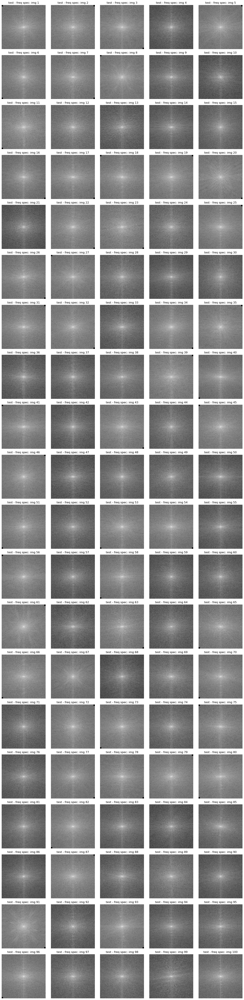

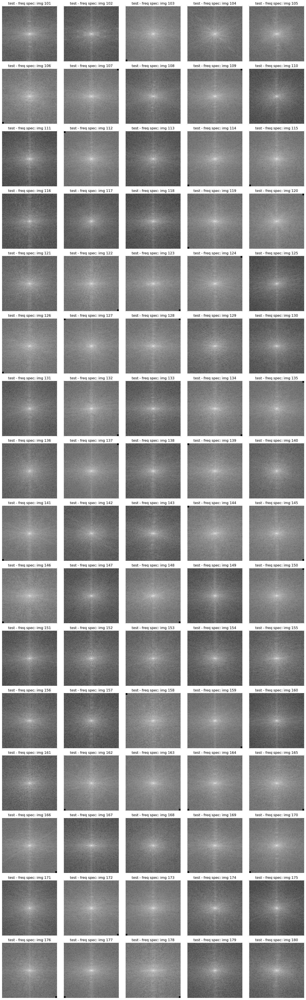

In [14]:
# Plotar todos os espectros de teste
plot_specs(X_test, title="test")

In [15]:
#pausa de teste

In [16]:
# Função que replica a operação da camada Lambda
def expand_channels(x):
    return tf.stack([x[..., 0]] * 3, axis=-1)

# Carregue o modelo com ambos os objetos personalizados
model = load_model(
    model_path,
    custom_objects={'tf': tf, '<lambda>': expand_channels},
    safe_mode=False
)

for layer in model.layers:
    if isinstance(layer, tf.keras.layers.Lambda):
        layer.function = expand_channels

for layer in model.layers:
    layer.trainable = False

I0000 00:00:1746851053.949827    1927 cuda_executor.cc:1001] could not open file to read NUMA node: /sys/bus/pci/devices/0000:10:00.0/numa_node
Your kernel may have been built without NUMA support.
I0000 00:00:1746851053.950460    1927 cuda_executor.cc:1001] could not open file to read NUMA node: /sys/bus/pci/devices/0000:10:00.0/numa_node
Your kernel may have been built without NUMA support.
I0000 00:00:1746851053.950761    1927 cuda_executor.cc:1001] could not open file to read NUMA node: /sys/bus/pci/devices/0000:10:00.0/numa_node
Your kernel may have been built without NUMA support.
I0000 00:00:1746851054.326428    1927 cuda_executor.cc:1001] could not open file to read NUMA node: /sys/bus/pci/devices/0000:10:00.0/numa_node
Your kernel may have been built without NUMA support.
I0000 00:00:1746851054.326810    1927 cuda_executor.cc:1001] could not open file to read NUMA node: /sys/bus/pci/devices/0000:10:00.0/numa_node
Your kernel may have been built without NUMA support.
2025-05-10

In [17]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lambda (Lambda)     │ (None, 224, 224,  │          0 │ input_layer[0][0] │
│                     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item (GetItem)  │ (None, 224, 224)  │          0 │ lambda[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_1          │ (None, 224, 224)  │          0 │ lambda[0][0]      │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_2          │ (None, 224, 224)  │          0 │ lambda[0][0]      │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stack (Stack)       │ (None, 224, 224,  │          0 │ get_item[0][0],   │
│                     │ 3)                │            │ get_item_1[0][0], │
│                     │                   │            │ get_item_2[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 224, 224,  │          0 │ stack[0][0]       │
│                     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ add[0][0]         │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r

 Total params: 71,624,854 (273.23 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 23,910,364 (91.21 MB)

 Optimizer params: 47,714,490 (182.02 MB)

In [18]:
#pausa de teste

In [19]:
from matplotlib import cm

In [20]:
def generate_heatmap(model, sample_image):
    sample_image_exp = np.expand_dims(sample_image, axis=0)

    # Obtem as ativações da última camada convolucional
    intermediate_model = Model(inputs=model.input, outputs=model.get_layer('conv_pw_13_relu').output)
    activations = intermediate_model.predict(sample_image_exp)
    activations = tf.convert_to_tensor(activations)

    predictions = model.predict(sample_image_exp)

    with tf.GradientTape() as tape:
        # Cria um modelo que nos dê a saída do modelo e as ativações da última camada convolucional
        iterate = Model([model.input], [model.output, model.get_layer('conv_pw_13_relu').output])
        model_out, last_conv_layer = iterate(sample_image_exp)
        
        # Pegua a saída da classe predita
        class_out = model_out[:, np.argmax(model_out[0])]
        
        # Registra as operações a serem diferenciadas
        tape.watch(last_conv_layer)
        
        # Calcula os gradientes
        grads = tape.gradient(class_out, last_conv_layer)
        
        # Mensagem de depuração para verificar gradientes
#       print("Gradients calculated:", grads)

    # Verifica se os gradientes foram calculados corretamente
    if grads is None:
        raise ValueError('Gradients could not be computed. Check the model and layer names.')
    
    # Média dos gradientes sobre as dimensões espaciais
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    
    # Mensagem de depuração para verificar pooled_grads
#   print("Pooled gradients:", pooled_grads)
    
    # Regularização dos gradientes
    pooled_grads = tf.where(pooled_grads == 0, tf.ones_like(pooled_grads) * 1e-10, pooled_grads)
    
    # Multiplique as ativações pelos gradientes ponderados e tire a média
    heatmap = tf.reduce_mean(tf.multiply(pooled_grads, last_conv_layer[0]), axis=-1)
    
    # Mensagem de depuração para verificar heatmap inicial
#   print("Initial heatmap:", heatmap)

    # Normaliza o heatmap se possível
    min_value = np.min(heatmap)
    
    # Normaliza o heatmap se possível
    max_value = np.max(heatmap)

    # Aplica ReLU para garantir que os valores sejam não-negativos
    heatmap = (heatmap - min_value) / (max_value - min_value)
    heatmap = np.asarray(heatmap)
    heatmap = (heatmap - 1) * (-1)

    # Mensagem de depuração para verificar heatmap normalizado
#   print("Normalized heatmap:", heatmap)
    
    # Redimensiona o heatmap para o tamanho da imagem de entrada
    heatmap_resized = cv2.resize(heatmap, (sample_image.shape[1], sample_image.shape[0]))
    heatmap_resized = np.uint8(255 * heatmap_resized)
    
    # Aplica um mapa de cores
    heatmap_colored = cm.jet(heatmap_resized)[:, :, :3]
    heatmap_colored = np.uint8(heatmap_colored * 255)
    
    # Cria um canal alfa a partir do heatmap redimensionado
    alpha_channel = np.uint8(heatmap_resized)
    heatmap_colored_with_alpha = np.dstack((heatmap_colored, alpha_channel))
    
    # Converte a imagem original para uint8 e RGBA
    sample_image_uint8 = np.uint8(255 * np.squeeze(sample_image))
    image_rgb = cv2.cvtColor(sample_image_uint8, cv2.COLOR_GRAY2RGB)
    image_rgba = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2RGBA)
    
    # Combina a imagem original com o heatmap
    alpha_factor = alpha_channel / 255.0
    for c in range(0, 3):
        image_rgba[..., c] = image_rgba[..., c] * (1 - alpha_factor) + heatmap_colored[..., c] * alpha_factor
    
    return image_rgba

In [25]:
# Gerar o mapa de calor
output_folder = 'AnyHeatmap'
type = 'png'

if not os.path.exists(output_folder):
    os.makedirs(output_folder)

def heatmap_models(model, image_normalized, nome):
    base_name = 'heatmap_' + nome
    output_filename = get_next_filename(output_folder, base_name, type)
    output_path = os.path.join(output_folder, output_filename)
    
    heatmap_image = generate_heatmap(model, image_normalized)
    plt.figure(figsize=(10, 5))
    
# Imagem original
    plt.subplot(1, 2, 1)
    plt.imshow(image_normalized.squeeze(), cmap='gray')
    plt.title('Original')
    plt.axis('off')
    
# Mapa de calor com predição
    plt.subplot(1, 2, 2)
    plt.imshow(heatmap_image)
    plt.title(f'ResNet50 {nome}')
    plt.axis('off')

    plt.tight_layout()
    plt.savefig(output_path)
    plt.show()

In [ ]:
for idx in tqdm(range(int(len(X_test)/2)), desc="Gerando Mapas de Ativação"):
    # Pré-processamento
    image = X_test[idx].astype('float32')
    image = np.expand_dims(image, axis=-1)
    
    # Gerar heatmap
    try:
        heatmap_image = generate_heatmap(model, image)
        
        # Plotar e salvar
        plt.figure(figsize=(10, 5))
        
        # Imagem Original
        plt.subplot(1, 2, 1)
        plt.imshow(image.squeeze(), cmap='gray')
        plt.title(f'Original - Img {idx}')
        plt.axis('off')
        
        # Mapa de Calor
        plt.subplot(1, 2, 2)
        plt.imshow(heatmap_image)
        plt.title(f'Heatmap - Classe: {y_test[idx]}')
        plt.axis('off')
        
        plt.tight_layout()
        plt.savefig(os.path.join(output_folder, f'heatmap_{nome}_test_{idx}.png'))
        plt.close()
    
    except Exception as e:
        print(f"Erro na imagem {idx}: {str(e)}")

Gerando Mapas de Ativação:   0%|                                                                 | 0/90 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


Gerando Mapas de Ativação:   1%|▋                                                        | 1/90 [00:02<04:21,  2.94s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Gerando Mapas de Ativação:   2%|█▎                                                       | 2/90 [00:05<04:13,  2.88s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Gerando Mapas de Ativação:   3%|█▉                                                       | 3/90 [00:08<03:50,  2.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Gerando Mapas de Ativação:   4%|██▌                                                      | 4/90 [00:11<04:01,  2.80s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Gerando Mapas de Ativação:   6%|███▏                                                     | 5/90 [00:14<04:14,  2.99s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Gerando Mapas de Ativação:   7%|███▊                                                     | 6/90 [00:17<04:08,  2.96s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Gerando Mapas de Ativação:   8%|████▍                                                    | 7/90 [00:23<05:26,  3.94s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Gerando Mapas de Ativação:   9%|█████                                                    | 8/90 [00:27<05:19,  3.90s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Gerando Mapas de Ativação:  10%|█████▋                                                   | 9/90 [00:29<04:43,  3.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Gerando Mapas de Ativação:  11%|██████▏                                                 | 10/90 [00:32<04:17,  3.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Gerando Mapas de Ativação:  12%|██████▊                                                 | 11/90 [00:35<04:12,  3.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


Gerando Mapas de Ativação:  13%|███████▍                                                | 12/90 [00:38<04:13,  3.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


Gerando Mapas de Ativação:  14%|████████                                                | 13/90 [00:43<04:48,  3.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Gerando Mapas de Ativação:  16%|████████▋                                               | 14/90 [00:46<04:16,  3.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Gerando Mapas de Ativação:  17%|█████████▎                                              | 15/90 [00:49<04:01,  3.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Gerando Mapas de Ativação:  18%|█████████▉                                              | 16/90 [00:51<03:43,  3.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Gerando Mapas de Ativação:  19%|██████████▌                                             | 17/90 [00:57<04:44,  3.89s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Gerando Mapas de Ativação:  20%|███████████▏                                            | 18/90 [01:02<04:50,  4.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


Gerando Mapas de Ativação:  21%|███████████▊                                            | 19/90 [01:06<04:49,  4.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Gerando Mapas de Ativação:  22%|████████████▍                                           | 20/90 [01:09<04:26,  3.81s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Gerando Mapas de Ativação:  23%|█████████████                                           | 21/90 [01:12<04:02,  3.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Gerando Mapas de Ativação:  24%|█████████████▋                                          | 22/90 [01:14<03:37,  3.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 11s 11s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step


Gerando Mapas de Ativação:  26%|██████████████▎                                         | 23/90 [01:38<10:28,  9.38s/it]

In [ ]:
# GC collect
tf.keras.backend.clear_session()
gc.collect()